# Draft of plotting feature matching results

Adapted from: https://github.com/anerv/BikeDNA_BIG/blob/main/feature_matching_hpc/scripts/feature_matching.py

In [1]:
# Load libraries, settings and data

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd
import momepy as mm
import matplotlib.pyplot as plt
import contextily as cx
import utils

In [8]:
# Define feature matching user settings
segment_length = 10  # The shorter the segments, the longer the matching process will take. For cities with a gridded street network with streets as straight lines, longer segments will usually work fine
buffer_dist = 15
hausdorff_threshold = 17
angular_threshold = 30

for s in [segment_length, buffer_dist, hausdorff_threshold, angular_threshold]:
    assert isinstance(s, int) or isinstance(s, float), print(
        "All parameters must be integer or float values!"
    )

In [2]:
# which FUA?
fua = 869

# which h3 resolution?
h3_resolution = 9

base_crs = "EPSG:4326"

# original base data
orig_file = f"../data/{fua}/roads_osm.parquet"

# which file to take as baseline?
base_file = f"../data/{fua}/manual/{fua}.parquet"

# where to save results?
res_folder = f"../data/{fua}/evaluation/"

read in data

In [3]:
meta = utils.read_sample_data()
geom = meta.loc[meta.eFUA_ID == fua, "geometry"]
city = meta.loc[meta.eFUA_ID == fua, "eFUA_name"].values[0]

In [4]:
# read in orig base data
orig = utils.read_parquet_roads(fua)
orig = orig[["geometry"]]

# get projected CRS 
proj_crs = orig.crs

# read in base case (manual simp)
base = utils.read_manual(fua, proj_crs=orig.crs)

# which file to compare with?
comp = utils.read_parenx(fua, "voronoi", proj_crs=orig.crs)

/Users/anvy/Library/CloudStorage/OneDrive-ITU/projects/simplification/code/utils.py:223: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  gdf = gdf.explode(ingore_index=True)


In [5]:
# get graphs & node/edge gdfs for both data sets
base_graph = mm.gdf_to_nx(base, length="length", integer_labels=True)
comp_graph = mm.gdf_to_nx(comp, length="length", integer_labels=True)
nodes_base, edges_base = mm.nx_to_gdf(base_graph)
nodes_comp, edges_comp = mm.nx_to_gdf(comp_graph)
# add node degree to nodes df
nodes_base = utils.add_node_degree(nodes_base, base_graph)
nodes_comp = utils.add_node_degree(nodes_comp, comp_graph)

read in h3 grid

In [6]:
# read in grid
grid = gpd.read_file(res_folder + "grid.gpkg", index = False)

matched v. unmatched

In [9]:
# READ IN FROM PARQUET
base_matched_segments = gpd.read_parquet(res_folder + f"base_matched_segments_{buffer_dist}_{hausdorff_threshold}_{angular_threshold}.parquet")
base_unmatched_segments = gpd.read_parquet(res_folder + f"base_unmatched_segments_{buffer_dist}_{hausdorff_threshold}_{angular_threshold}.parquet")
comp_matched_segments = gpd.read_parquet(res_folder + f"comp_matched_segments_{buffer_dist}_{hausdorff_threshold}_{angular_threshold}.parquet")
comp_unmatched_segments = gpd.read_parquet(res_folder + f"comp_unmatched_segments_{buffer_dist}_{hausdorff_threshold}_{angular_threshold}.parquet")


visualize (overview)

In [10]:
mytile = cx.providers.CartoDB.Voyager
myfigsize = (30,30)

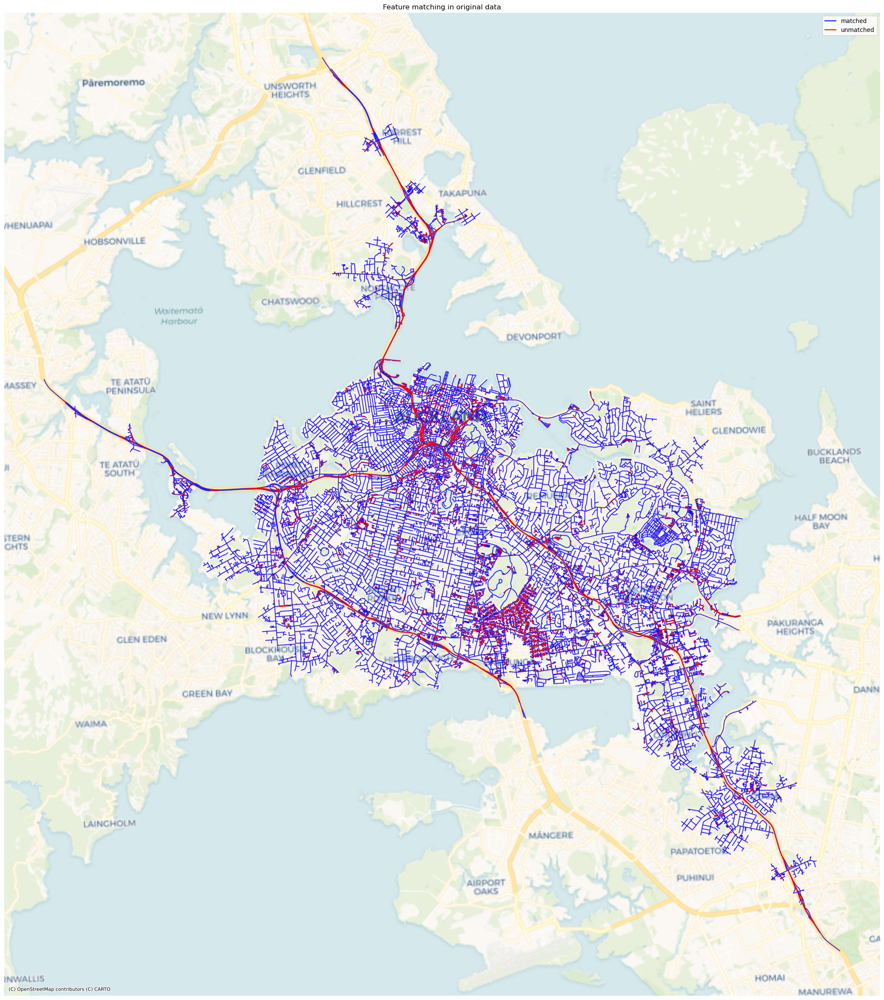

In [11]:
# OSM
fig, ax = plt.subplots(1, 1, figsize = myfigsize)

base_matched_segments.plot(
    ax=ax, 
    color="blue", 
    label="matched"
)

base_unmatched_segments.plot(
    ax=ax, 
    color="red", 
    label="unmatched"
)

cx.add_basemap(ax=ax, crs=proj_crs, source=mytile)
ax.set_axis_off()
ax.set_title("Feature matching in original data")
ax.legend();

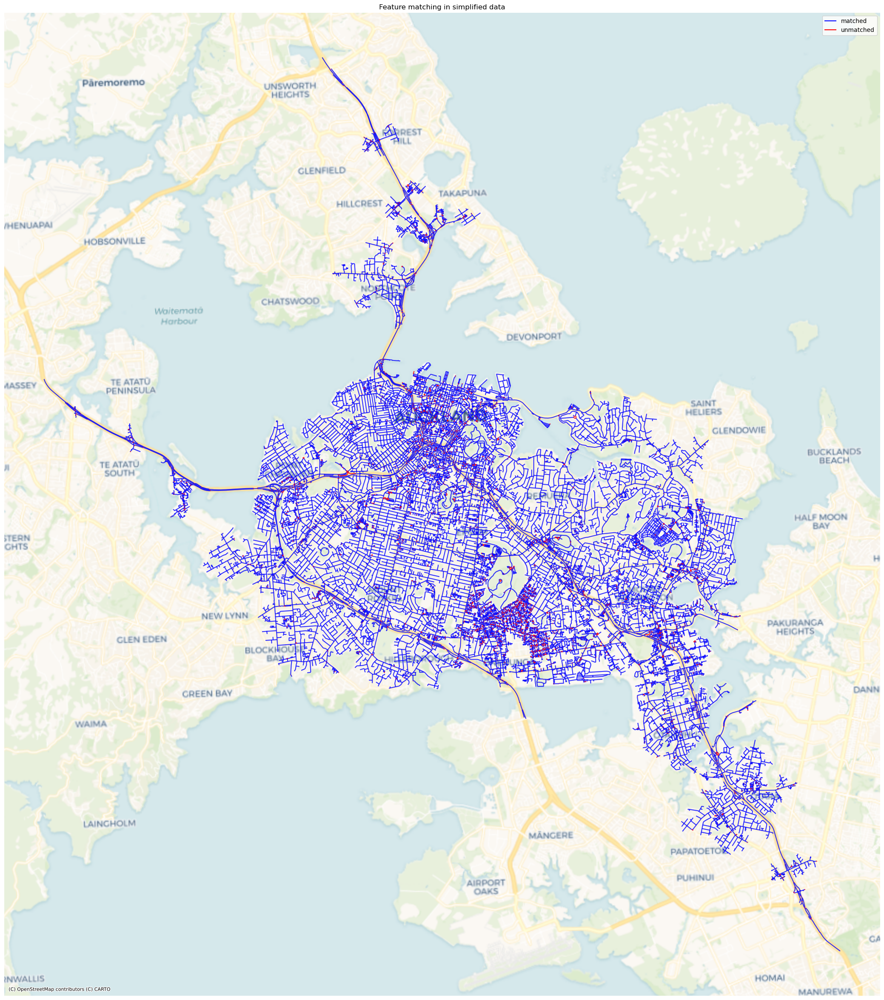

In [12]:
fig, ax = plt.subplots(1, 1, figsize = myfigsize)

comp_matched_segments.plot(
    ax=ax, 
    color="blue", 
    label="matched"
)

comp_unmatched_segments.plot(
    ax=ax, 
    color="red", 
    label="unmatched"
)

cx.add_basemap(ax=ax, crs=proj_crs, source=mytile)
ax.set_axis_off()
ax.set_title("Feature matching in simplified data")
ax.legend();


visualize (per gridcell)

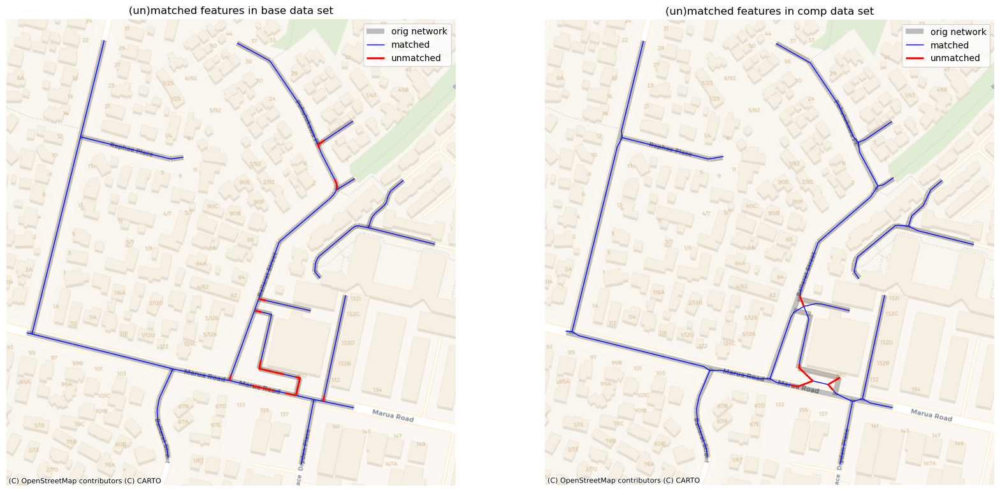

In [13]:
fig, ax = utils.plot_cell_featurematching(
    grid_id=0,
    grid=grid,
    orig=orig,
    matched_base=base_matched_segments,
    unmatched_base=base_unmatched_segments,
    matched_comp=comp_matched_segments,
    unmatched_comp=comp_unmatched_segments
    )

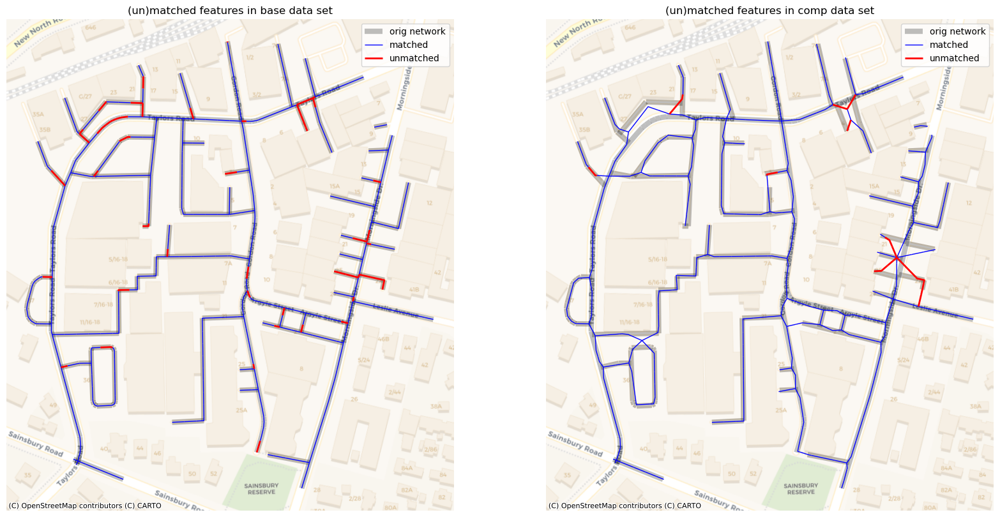

In [16]:
fig, ax = utils.plot_cell_featurematching(
    grid_id=111,
    grid=grid,
    orig=orig,
    matched_base=base_matched_segments,
    unmatched_base=base_unmatched_segments,
    matched_comp=comp_matched_segments,
    unmatched_comp=comp_unmatched_segments
    )

/Users/anvy/Library/CloudStorage/OneDrive-ITU/projects/simplification/code/utils.py:350: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  geopandas.clip(unmatched_comp, geom).plot(


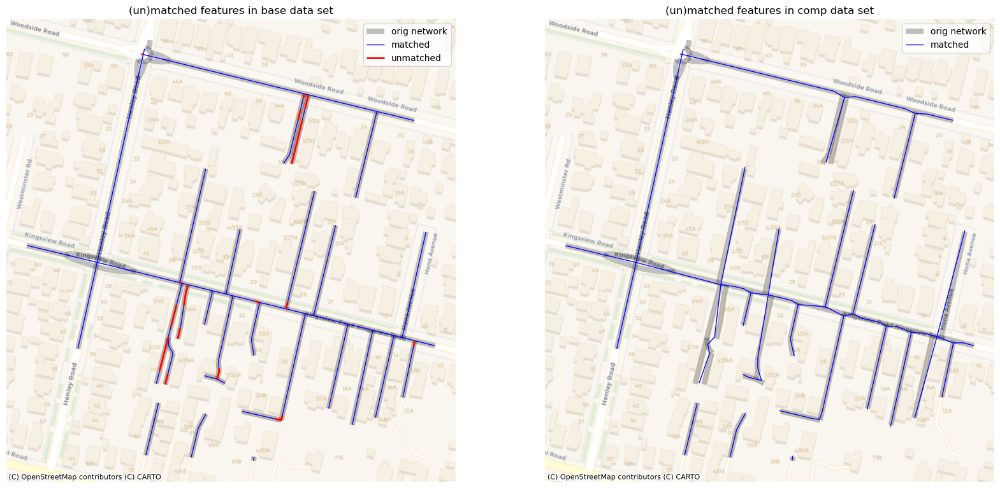

In [15]:
fig, ax = utils.plot_cell_featurematching(
    grid_id=2,
    grid=grid,
    orig=orig,
    matched_base=base_matched_segments,
    unmatched_base=base_unmatched_segments,
    matched_comp=comp_matched_segments,
    unmatched_comp=comp_unmatched_segments
    )

### Compare what 2 matched segments (from base and comp data sets) look like:

In [46]:
base_matched_segments.head()

,length,node_start,node_end,geometry,seg_id,angle,hausdorff_dist
0,1219.300725,0,1,"LINESTRING (312579.495 -4097098.169, 312584.92...",1000,NaN,None
1,1219.300725,0,1,"LINESTRING (312584.924 -4097106.567, 312590.35...",1001,NaN,None
2,1219.300725,0,1,"LINESTRING (312590.354 -4097114.965, 312595.78...",1002,NaN,None
3,1219.300725,0,1,"LINESTRING (312595.783 -4097123.363, 312601.21...",1003,NaN,None
4,1219.300725,0,1,"LINESTRING (312601.212 -4097131.761, 312606.64...",1004,NaN,None


In [47]:
comp_matched_segments.head()

,length,node_start,node_end,geometry,seg_id_comp,matches_ix,matches_id
0,895.100672,0,1,"LINESTRING (313401.924 -4097976.903, 313393.92...",1000,121,1121
1,895.100672,0,1,"LINESTRING (313393.929 -4097970.897, 313385.93...",1001,120,1120
2,895.100672,0,1,"LINESTRING (313385.933 -4097964.891, 313377.93...",1002,119,1119
3,895.100672,0,1,"LINESTRING (313377.938 -4097958.885, 313369.94...",1003,118,1118
4,895.100672,0,1,"LINESTRING (313369.942 -4097952.880, 313361.94...",1004,117,1117


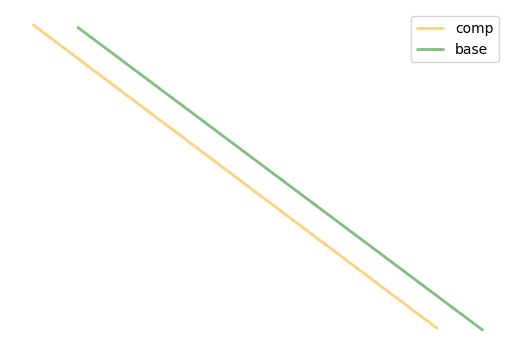

In [48]:
csix = 25
fig, ax = plt.subplots(1,1)
comp_matched_segments.filter([csix], axis = 0).plot(
    ax=ax, color = "orange", label = "comp", alpha = 0.5, lw = 2)
base_matched_segments.loc[
    base_matched_segments["seg_id"]==comp_matched_segments.loc[csix,"matches_id"]
    ].plot(ax=ax, color = "green", label = "base", alpha = 0.5, lw = 2)
ax.set_axis_off()
# cx.add_basemap(
#     ax=ax,
#     crs=grid.crs,
#     source=cx.providers.CartoDB.Voyager,
#     zorder=0
#     )
ax.legend();